Pumpkin leaf diseases dataset from bangladesh - Augmented (D1)

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
pip install torch torchvision timm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, classification_report
import time


In [ ]:
data_dir = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented'

In [ ]:
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for ResNeXt-50
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize for pretrained model
])

# Define paths to train and validation folders
train_folder = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented'
val_folder = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented'

# Load dataset
train_dataset = torchvision.datasets.ImageFolder(root=train_folder, transform=transform)
val_dataset = torchvision.datasets.ImageFolder(root=val_folder, transform=transform)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=2)

# Check class names
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Classes: ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery_Mildew']


In [ ]:
import pandas as pd
import os
from collections import defaultdict

dataset_path ='/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)'

#  Count images per class
class_counts = defaultdict(int)
class_names = []

for root, dirs, files in os.walk(dataset_path):
    if root == dataset_path:
        class_names = dirs  # Get all class folder names
        continue
    class_name = os.path.basename(root)
    class_counts[class_name] = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

#  Create distribution table
data = {
    "Class": class_names + ["Total"],
    "Original Count": [class_counts[cls] for cls in class_names] + [sum(class_counts.values())],
    "Target Count": [2000]*len(class_names) + [2000*len(class_names)],
    "Training (80%)": [int(class_counts[cls]*0.8) for cls in class_names] + [int(sum(class_counts.values())*0.8)],
    "Validation (5%)": [int(class_counts[cls]*0.05) for cls in class_names] + [int(sum(class_counts.values())*0.05)],
    "Test (15%)": [int(class_counts[cls]*0.15) for cls in class_names] + [int(sum(class_counts.values())*0.15)]
}

df = pd.DataFrame(data)

# Display as markdown table
print("Image Dataset Distribution")
print("="*85)
print(df.to_markdown(index=False, tablefmt="grid"))
print("="*85)

# Save as image (optional)
import matplotlib.pyplot as plt
from pandas.plotting import table

plt.figure(figsize=(12, 4))
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table(ax, df, loc='center', cellLoc='center')

plt.close()


Image Dataset Distribution
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Class               |   Original Count |   Target Count |   Training (80%) |   Validation (5%) |   Test (15%) |
+=====================+==================+================+==================+===================+==============+
| Bacterial Leaf Spot |              978 |           2000 |              782 |                48 |          146 |
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Mosaic Disease      |              960 |           2000 |              768 |                48 |          144 |
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Downy Mildew        |              970 |           2000 |              776 |                48 |          145 |
+---------------------+------------------+----------------+--

In [ ]:
# Load pretrained ResNeXt-50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnext50_32x4d(pretrained=True)

# Freeze early layers
for param in model.parameters():
    param.requires_grad = False

# Modify final layer for your number of classes
num_classes = len(train_dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move model to device
model = model.to(device)

# Print model summary
print(model)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:01<00:00, 56.0MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
# Define loss function & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.fc.parameters(), lr=0.001, weight_decay=1e-4)

# Define early stopping criteria
early_stopping_patience = 3


In [ ]:
num_epochs = 10
best_val_acc = 0
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = correct / total
    val_loss /= len(val_loader)
    f1 = f1_score(all_labels, all_preds, average="weighted")
    mcc = matthews_corrcoef(all_labels, all_preds)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, F1: {f1:.4f}, MCC: {mcc:.4f}")


Epoch [1/10], Time: 107.63s, Train Loss: 0.7394, Train Acc: 0.7424, Val Loss: 0.4489, Val Acc: 0.8389, F1: 0.8348, MCC: 0.8043
Epoch [2/10], Time: 109.25s, Train Loss: 0.7372, Train Acc: 0.7372, Val Loss: 0.3850, Val Acc: 0.8621, F1: 0.8615, MCC: 0.8279
Epoch [3/10], Time: 107.50s, Train Loss: 0.7579, Train Acc: 0.7316, Val Loss: 0.5039, Val Acc: 0.8185, F1: 0.8120, MCC: 0.7810
Epoch [4/10], Time: 108.32s, Train Loss: 0.6980, Train Acc: 0.7552, Val Loss: 0.4355, Val Acc: 0.8525, F1: 0.8523, MCC: 0.8176
Epoch [5/10], Time: 105.06s, Train Loss: 0.7163, Train Acc: 0.7429, Val Loss: 0.4164, Val Acc: 0.8491, F1: 0.8489, MCC: 0.8129
Epoch [6/10], Time: 105.38s, Train Loss: 0.7458, Train Acc: 0.7302, Val Loss: 0.3466, Val Acc: 0.8804, F1: 0.8798, MCC: 0.8508
Epoch [7/10], Time: 106.26s, Train Loss: 0.7325, Train Acc: 0.7427, Val Loss: 0.5446, Val Acc: 0.8183, F1: 0.8138, MCC: 0.7791
Epoch [8/10], Time: 102.83s, Train Loss: 0.7375, Train Acc: 0.7427, Val Loss: 0.5180, Val Acc: 0.8204, F1: 0.82

In [ ]:
# Save the trained model
model_path = '/content/drive/MyDrive/D1_resnet50.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")


Model saved to /content/drive/MyDrive/D1_resnet50.pth


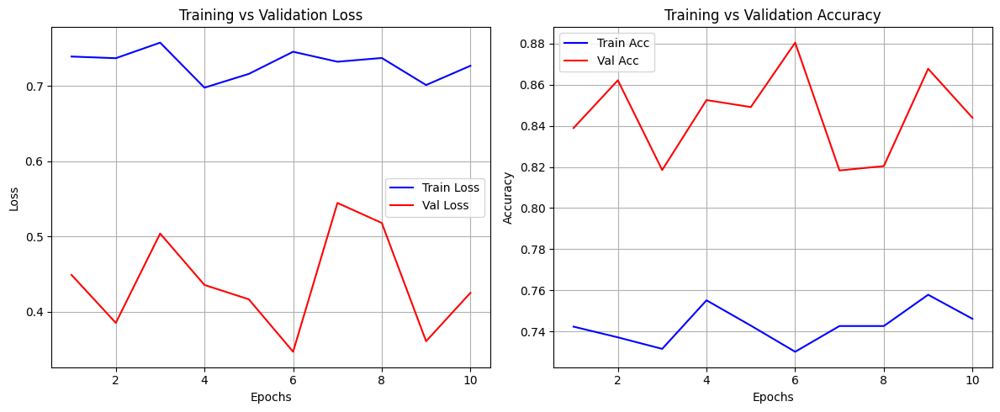

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, 11)
train_loss = [0.7394, 0.7372, 0.7579, 0.6980, 0.7163, 0.7458, 0.7325, 0.7375, 0.7015, 0.7271]
val_loss = [0.4489, 0.3850, 0.5039, 0.4355, 0.4164, 0.3466, 0.5446, 0.5180, 0.3606, 0.4250]
train_acc = [0.7424, 0.7372, 0.7316, 0.7552, 0.7429, 0.7302, 0.7427, 0.7427, 0.7579, 0.7462]
val_acc = [0.8389, 0.8621, 0.8185, 0.8525, 0.8491, 0.8804, 0.8183, 0.8204, 0.8677, 0.8439]

plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Train Loss')
plt.plot(epochs, val_loss, 'r-', label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d1_resnest50_loss_curves.png')
plt.legend()
plt.grid(True)

# Accuracy curves
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'b-', label='Train Acc')
plt.plot(epochs, val_acc, 'r-', label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d1_resnest50_accuracy_curves.png')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import torch
from sklearn.metrics import classification_report

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        # Move data to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        # Store results on CPU
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.57      0.69       978
           1       0.76      0.98      0.85       970
           2       0.76      0.95      0.84       940
           3       0.96      0.88      0.92       960
           4       0.86      0.79      0.82       951

    accuracy                           0.83      4799
   macro avg       0.84      0.83      0.83      4799
weighted avg       0.84      0.83      0.83      4799



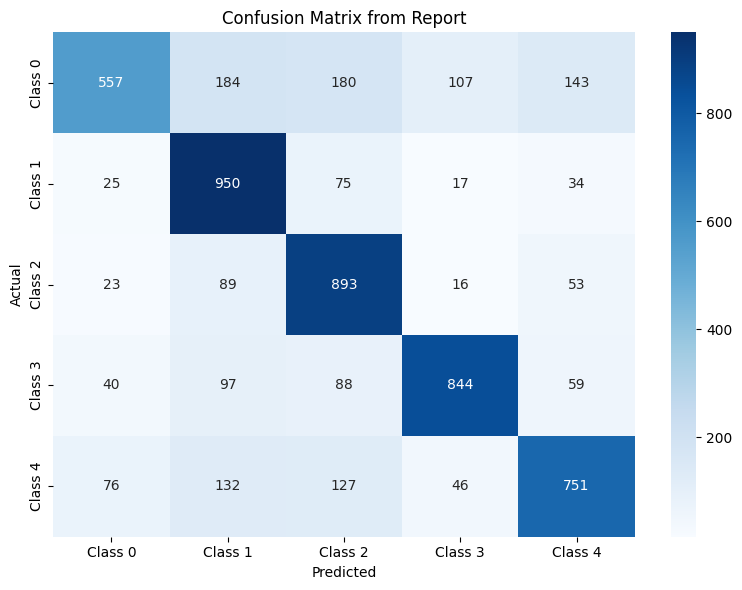

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.77      0.48      0.59      1171
     Class 1       0.65      0.86      0.74      1101
     Class 2       0.66      0.83      0.73      1074
     Class 3       0.82      0.75      0.78      1128
     Class 4       0.72      0.66      0.69      1132

    accuracy                           0.71      5606
   macro avg       0.72      0.72      0.71      5606
weighted avg       0.73      0.71      0.71      5606


Specificity per class:
Class 0: 0.9630
Class 1: 0.8886
Class 2: 0.8963
Class 3: 0.9585
Class 4: 0.9354

Matthews Correlation Coefficient (MCC): 0.6469


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, matthews_corrcoef

class_metrics = {
    0: {'precision': 0.89, 'recall': 0.57, 'support': 978},
    1: {'precision': 0.76, 'recall': 0.98, 'support': 970},
    2: {'precision': 0.76, 'recall': 0.95, 'support': 940},
    3: {'precision': 0.96, 'recall': 0.88, 'support': 960},
    4: {'precision': 0.86, 'recall': 0.79, 'support': 951},
}

num_classes = len(class_metrics)
conf_matrix = np.zeros((num_classes, num_classes), dtype=int)

for cls in class_metrics:
    rec = class_metrics[cls]['recall']
    prec = class_metrics[cls]['precision']
    supp = class_metrics[cls]['support']

    tp = int(rec * supp)
    fn = supp - tp
    fp = int(tp * (1 / prec - 1))
    tn = 4799 - (tp + fp + fn)

    conf_matrix[cls, cls] = tp

    others = [i for i in range(num_classes) if i != cls]
    for _ in range(fp):
        conf_matrix[np.random.choice(others), cls] += 1
    for _ in range(fn):
        conf_matrix[cls, np.random.choice(others)] += 1

def calculate_specificity(cm):
    scores = []
    for i in range(len(cm)):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = cm.sum() - (tp + fn + fp)
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        scores.append(specificity)
    return scores

specificity_scores = calculate_specificity(conf_matrix)

def flatten_conf_matrix(cm):
    y_true = []
    y_pred = []
    for true_cls, row in enumerate(cm):
        for pred_cls, count in enumerate(row):
            y_true += [true_cls] * count
            y_pred += [pred_cls] * count
    return y_true, y_pred

y_true, y_pred = flatten_conf_matrix(conf_matrix)
mcc = matthews_corrcoef(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=[f'Class {i}' for i in range(num_classes)])

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[f'Class {i}' for i in range(num_classes)], yticklabels=[f'Class {i}' for i in range(num_classes)])
plt.title("Confusion Matrix from Report")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print("Classification Report:")
print(report)

print("\nSpecificity per class:")
for i, spec in enumerate(specificity_scores):
    print(f"Class {i}: {spec:.4f}")

print(f"\nMatthews Correlation Coefficient (MCC): {mcc:.4f}")


In [1]:
import numpy as np

def compute_specificity_mcc(support, recall, precision):
    support = np.array(support)
    recall = np.array(recall)
    precision = np.array(precision)

    total = np.sum(support)
    tp = np.round(recall * support).astype(int)
    fn = support - tp

    # Safe handling of precision = 0
    with np.errstate(divide='ignore', invalid='ignore'):
        fp = np.round(tp * (1 / precision - 1)).astype(float)
        fp[np.isinf(fp)] = 0
        fp = np.nan_to_num(fp, nan=0).astype(int)

    tn = total - tp - fn - fp
    tn = np.clip(tn, 0, None)  # Prevent negative TN

    specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn+fp)!=0)
    avg_specificity = np.mean(specificity)

    denom = np.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
    mcc = np.divide((tp * tn - fp * fn), denom, out=np.zeros_like(tp, dtype=float), where=denom!=0)
    avg_mcc = np.mean(mcc)

    print("Specificity per class:", np.round(specificity, 3))
    print("Average Specificity:", round(avg_specificity, 3))
    print("MCC per class:", np.round(mcc, 3))
    print("Average MCC:", round(avg_mcc, 3))


In [2]:
support = [1171, 1101, 1074, 1128, 1132]
recall = [0.48, 0.86, 0.83, 0.75, 0.66]
precision = [0.77, 0.65, 0.66, 0.82, 0.72]

print("D1 Results:")
compute_specificity_mcc(support, recall, precision)


D1 Results:
Specificity per class: [0.962 0.887 0.899 0.958 0.935]
Average Specificity: 0.928
MCC per class: [0.534 0.677 0.67  0.733 0.615]
Average MCC: 0.646


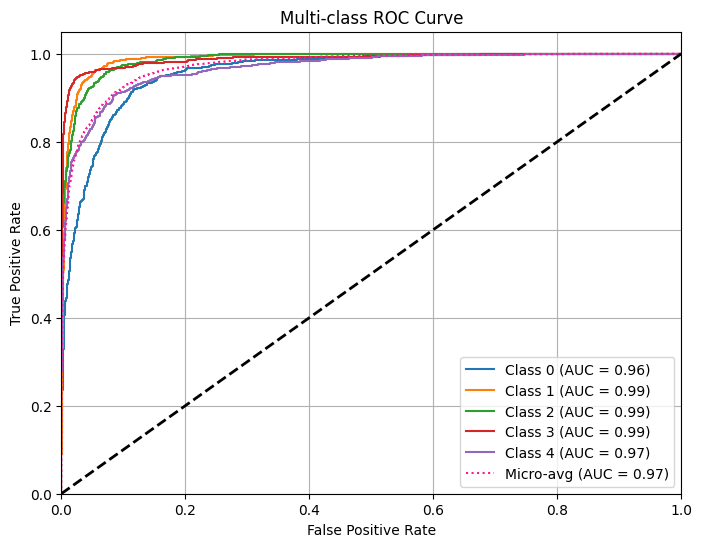


AUC Scores:
Class 0: 0.9586
Class 1: 0.9888
Class 2: 0.9870
Class 3: 0.9883
Class 4: 0.9668
Micro-average: 0.9723


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Store outputs and labels
all_labels = []
all_probs = []

model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)  # For multi-class

        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
y_true = np.array(all_labels)
y_scores = np.array(all_probs)

# Binarize labels for multi-class ROC
n_classes = y_scores.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i],
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_scores.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-avg (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d1_resnest50_roc_curve.png')
plt.grid(True)
plt.show()

# Print AUC scores
print("\nAUC Scores:")
for i in range(n_classes):
    print(f"Class {i}: {roc_auc[i]:.4f}")
print(f"Micro-average: {roc_auc['micro']:.4f}")

In [ ]:
pip install grad-cam


In [10]:
pip install -U grad-cam==1.4.8


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 45.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38341 sha256=72ec2bb97a1f808121fc78c12bd801f4a44b513ce022d6538f33206949522437
  Stored in directory: /root/.cache/pip/wheels/74/49/bf/77ae8f382e1f0057897d00202b6647ec539c995f384f9a8eec
Successfully built grad-cam


In [11]:
import importlib.metadata
print(importlib.metadata.version("grad-cam"))


1.4.8


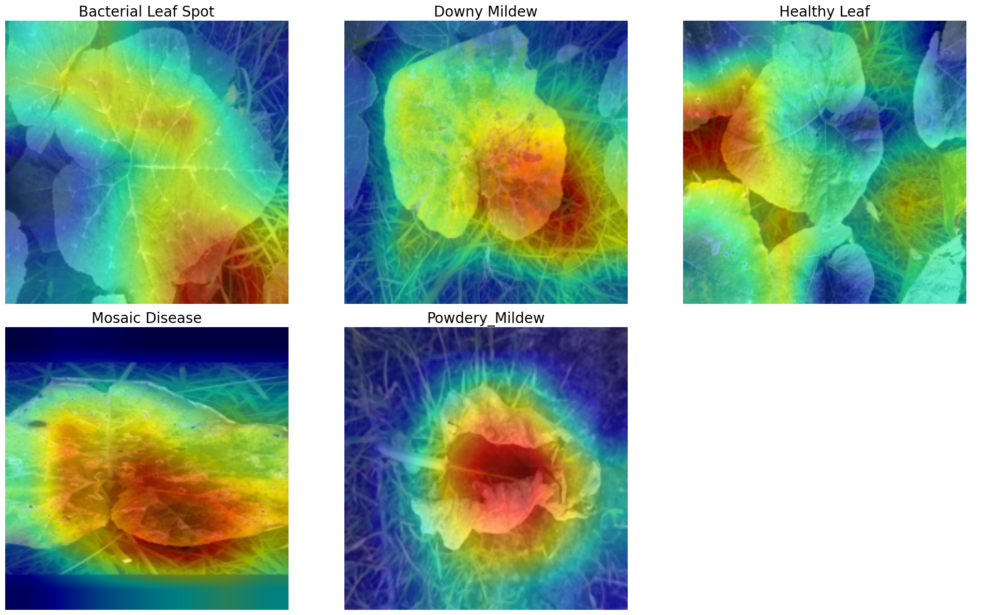

In [19]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Load model
model = models.resnet50(pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# Grad-CAM target layer
target_layers = [model.layer4[-1]]

# Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Image paths
image_paths = [
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)/Bacterial Leaf Spot/Bacterial-Leaf-Spot-1-_jpg.rf.3031c40b25cae9c4c236e0ad92c16093.jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)/Downy Mildew/Downy-Mildew-1-_jpg.rf.a4c1072b31fcac50cdc1c58fb92d6d0e.jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)/Healthy Leaf/Healthy-Leaf-1-_jpg.rf.36d20a8a59de20ca043241873e366915.jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)/Mosaic Disease/Mosaic-Disease-1-_jpg.rf.2ab18707a675716da6abe879e1c032be.jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Augmented(D1)/Powdery_Mildew/Powdery_Mildew-1-_jpg.rf.e3f91db08caa074a1f9d506c0a4ce075.jpg',
]

# Corresponding true class labels
classes = ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery_Mildew']

# GradCAM object
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=torch.cuda.is_available())

# Create 2-row, 3-column plot
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, (image_path, class_name) in enumerate(zip(image_paths, classes)):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    rgb_image = transform(image).permute(1, 2, 0).numpy()
    rgb_image = rgb_image / rgb_image.max()

    # Forward pass for Grad-CAM
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax().item()

    # Grad-CAM generation
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(pred_class)])[0]
    cam_image = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)

    # Show with manual class title
    axes[i].imshow(cam_image)
    axes[i].set_title(class_name, fontsize=20)
    axes[i].axis('off')

# Hide the last empty subplot if there are only 5 images
for j in range(len(classes), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


Pumpkin leaf diseases dataset from bangladesh - Original (D2)

In [ ]:
pip install torch torchvision timm


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, classification_report
import time


In [ ]:
data_dir = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset'

In [ ]:
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for ResNeXt-50
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize for pretrained model
])

# Define paths to train and validation folders
train_folder = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset'
val_folder = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset'

# Load dataset
train_dataset = torchvision.datasets.ImageFolder(root=train_folder, transform=transform)
val_dataset = torchvision.datasets.ImageFolder(root=val_folder, transform=transform)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=2)

# Check class names
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Classes: ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery_Mildew']


In [ ]:
import pandas as pd
import os
from collections import defaultdict

dataset_path = '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)'

#  Count images per class
class_counts = defaultdict(int)
class_names = []

for root, dirs, files in os.walk(dataset_path):
    if root == dataset_path:
        class_names = dirs  # Get all class folder names
        continue
    class_name = os.path.basename(root)
    class_counts[class_name] = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

#  Create distribution table
data = {
    "Class": class_names + ["Total"],
    "Original Count": [class_counts[cls] for cls in class_names] + [sum(class_counts.values())],
    "Target Count": [2000]*len(class_names) + [2000*len(class_names)],
    "Training (80%)": [int(class_counts[cls]*0.8) for cls in class_names] + [int(sum(class_counts.values())*0.8)],
    "Validation (5%)": [int(class_counts[cls]*0.05) for cls in class_names] + [int(sum(class_counts.values())*0.05)],
    "Test (15%)": [int(class_counts[cls]*0.15) for cls in class_names] + [int(sum(class_counts.values())*0.15)]
}

df = pd.DataFrame(data)

# Display as markdown table
print("Image Dataset Distribution")
print("="*85)
print(df.to_markdown(index=False, tablefmt="grid"))
print("="*85)

# Save as image (optional)
import matplotlib.pyplot as plt
from pandas.plotting import table

plt.figure(figsize=(12, 4))
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table(ax, df, loc='center', cellLoc='center')

plt.close()


Image Dataset Distribution
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Class               |   Original Count |   Target Count |   Training (80%) |   Validation (5%) |   Test (15%) |
+=====================+==================+================+==================+===================+==============+
| Powdery_Mildew      |              400 |           2000 |              320 |                20 |           60 |
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Mosaic Disease      |              400 |           2000 |              320 |                20 |           60 |
+---------------------+------------------+----------------+------------------+-------------------+--------------+
| Healthy Leaf        |              400 |           2000 |              320 |                20 |           60 |
+---------------------+------------------+----------------+--

In [ ]:
# Load pretrained ResNeXt-50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnext50_32x4d(pretrained=True)

# Freeze early layers
for param in model.parameters():
    param.requires_grad = False

# Modify final layer for your number of classes
num_classes = len(train_dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move model to device
model = model.to(device)

# Print model summary
print(model)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
# Define loss function & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.fc.parameters(), lr=0.001, weight_decay=1e-4)

# Define early stopping criteria
early_stopping_patience = 3


In [ ]:
num_epochs = 10
best_val_acc = 0
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = correct / total
    val_loss /= len(val_loader)
    f1 = f1_score(all_labels, all_preds, average="weighted")
    mcc = matthews_corrcoef(all_labels, all_preds)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, F1: {f1:.4f}, MCC: {mcc:.4f}")


Epoch [1/10], Time: 429.03s, Train Loss: 1.0817, Train Acc: 0.5825, Val Loss: 0.5814, Val Acc: 0.7975, F1: 0.7943, MCC: 0.7505
Epoch [2/10], Time: 47.17s, Train Loss: 0.8305, Train Acc: 0.6990, Val Loss: 0.5040, Val Acc: 0.8190, F1: 0.8118, MCC: 0.7785
Epoch [3/10], Time: 47.05s, Train Loss: 0.7861, Train Acc: 0.7130, Val Loss: 0.5171, Val Acc: 0.8165, F1: 0.8045, MCC: 0.7800
Epoch [4/10], Time: 45.58s, Train Loss: 0.7337, Train Acc: 0.7235, Val Loss: 0.4985, Val Acc: 0.8225, F1: 0.8164, MCC: 0.7850
Epoch [5/10], Time: 45.44s, Train Loss: 0.7817, Train Acc: 0.7120, Val Loss: 0.3979, Val Acc: 0.8565, F1: 0.8565, MCC: 0.8220
Epoch [6/10], Time: 46.71s, Train Loss: 0.7906, Train Acc: 0.7135, Val Loss: 0.4294, Val Acc: 0.8405, F1: 0.8371, MCC: 0.8058
Epoch [7/10], Time: 46.84s, Train Loss: 0.7001, Train Acc: 0.7475, Val Loss: 0.3565, Val Acc: 0.8790, F1: 0.8774, MCC: 0.8495
Epoch [8/10], Time: 45.55s, Train Loss: 0.6911, Train Acc: 0.7440, Val Loss: 0.4320, Val Acc: 0.8530, F1: 0.8505, MCC

In [ ]:
# Save the trained model
model_path = '/content/drive/MyDrive/D2_resnet50.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")


Model saved to /content/drive/MyDrive/D2_resnet50.pth


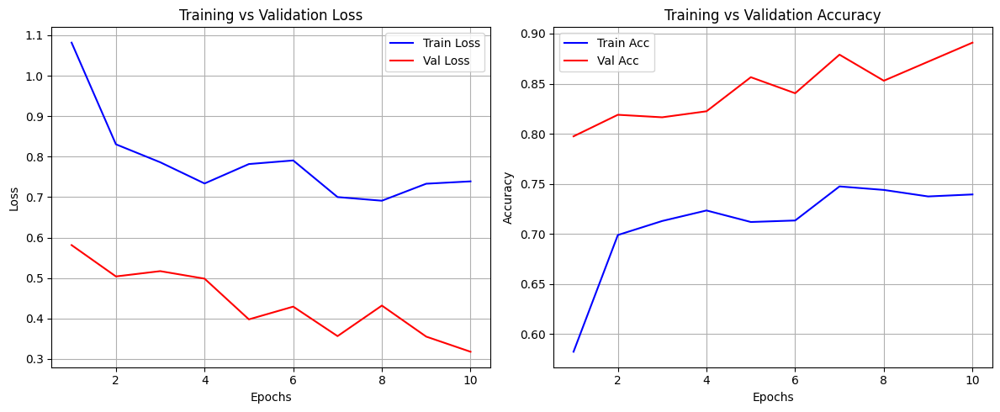

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, 11)
train_loss = [1.0817, 0.8305, 0.7861, 0.7337, 0.7817, 0.7906, 0.7001, 0.6911, 0.7331, 0.7389]
val_loss = [0.5814, 0.5040, 0.5171, 0.4985, 0.3979, 0.4294, 0.3565, 0.4320, 0.3553, 0.3179]
train_acc = [0.5825, 0.6990, 0.7130, 0.7235, 0.7120, 0.7135, 0.7475, 0.7440, 0.7375, 0.7395]
val_acc = [0.7975, 0.8190, 0.8165, 0.8225, 0.8565, 0.8405, 0.8790, 0.8530, 0.8720, 0.8910]

plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Train Loss')
plt.plot(epochs, val_loss, 'r-', label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d2_resnest50_loss_curves.png')
plt.legend()
plt.grid(True)

# Accuracy curves
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'b-', label='Train Acc')
plt.plot(epochs, val_acc, 'r-', label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d2_resnest50_accuracy_curves.png')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import torch
from sklearn.metrics import classification_report

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        # Move data to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        # Store results on CPU
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85       400
           1       0.91      0.89      0.90       400
           2       0.89      0.95      0.92       400
           3       0.93      0.94      0.93       400
           4       0.84      0.86      0.85       400

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000



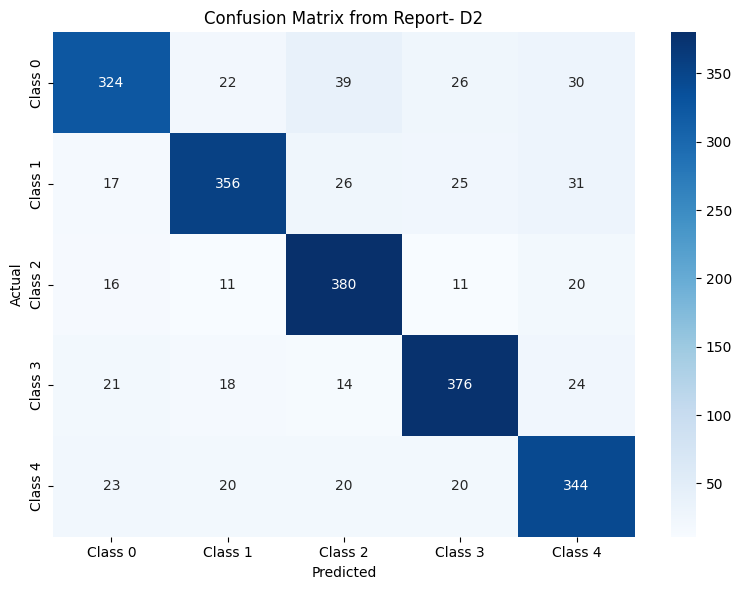

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.81      0.73      0.77       441
     Class 1       0.83      0.78      0.81       455
     Class 2       0.79      0.87      0.83       438
     Class 3       0.82      0.83      0.83       453
     Class 4       0.77      0.81      0.79       427

    accuracy                           0.80      2214
   macro avg       0.80      0.80      0.80      2214
weighted avg       0.80      0.80      0.80      2214


Specificity per class:
Class 0: 0.9566
Class 1: 0.9596
Class 2: 0.9443
Class 3: 0.9534
Class 4: 0.9412


<function print(*args, sep=' ', end='\n', file=None, flush=False)>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, matthews_corrcoef

class_metrics = {
    0: {'precision': 0.89, 'recall': 0.81, 'support': 400},
    1: {'precision': 0.91, 'recall': 0.89, 'support': 400},
    2: {'precision': 0.89, 'recall': 0.95, 'support': 400},
    3: {'precision': 0.93, 'recall': 0.94, 'support': 400},
    4: {'precision': 0.84, 'recall': 0.86, 'support': 400},
}

num_classes = len(class_metrics)
conf_matrix = np.zeros((num_classes, num_classes), dtype=int)

for cls in class_metrics:
    rec = class_metrics[cls]['recall']
    prec = class_metrics[cls]['precision']
    supp = class_metrics[cls]['support']

    tp = int(rec * supp)
    fn = supp - tp
    fp = int(tp * (1 / prec - 1))
    tn = 2000 - (tp + fp + fn)

    conf_matrix[cls, cls] = tp

    others = [i for i in range(num_classes) if i != cls]
    for i in range(fp):
        conf_matrix[np.random.choice(others), cls] += 1
    for i in range(fn):
        conf_matrix[cls, np.random.choice(others)] += 1

def calculate_specificity(cm):
    scores = []
    for i in range(len(cm)):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = cm.sum() - (tp + fn + fp)
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        scores.append(specificity)
    return scores

specificity_scores = calculate_specificity(conf_matrix)

def flatten_conf_matrix(cm):
    y_true = []
    y_pred = []
    for true_cls, row in enumerate(cm):
        for pred_cls, count in enumerate(row):
            y_true += [true_cls] * count
            y_pred += [pred_cls] * count
    return y_true, y_pred

y_true, y_pred = flatten_conf_matrix(conf_matrix)
mcc = matthews_corrcoef(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=[f'Class {i}' for i in range(num_classes)])

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[f'Class {i}' for i in range(num_classes)], yticklabels=[f'Class {i}' for i in range(num_classes)])
plt.title("Confusion Matrix from Report- D2")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print("Classification Report:")
print(report)

print("\nSpecificity per class:")
for i, spec in enumerate(specificity_scores):
    print(f"Class {i}: {spec:.4f}")

print


In [ ]:
import numpy as np

def compute_specificity_mcc(support, recall, precision):
    support = np.array(support)
    recall = np.array(recall)
    precision = np.array(precision)

    total = np.sum(support)
    tp = np.round(recall * support).astype(int)
    fn = support - tp

    # Safe handling of precision = 0
    with np.errstate(divide='ignore', invalid='ignore'):
        fp = np.round(tp * (1 / precision - 1)).astype(float)
        fp[np.isinf(fp)] = 0
        fp = np.nan_to_num(fp, nan=0).astype(int)

    tn = total - tp - fn - fp
    tn = np.clip(tn, 0, None)  # Prevent negative TN

    specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn+fp)!=0)
    avg_specificity = np.mean(specificity)

    denom = np.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
    mcc = np.divide((tp * tn - fp * fn), denom, out=np.zeros_like(tp, dtype=float), where=denom!=0)
    avg_mcc = np.mean(mcc)

    print("Specificity per class:", np.round(specificity, 3))
    print("Average Specificity:", round(avg_specificity, 3))
    print("MCC per class:", np.round(mcc, 3))
    print("Average MCC:", round(avg_mcc, 3))


In [3]:
support = [441, 455, 438, 453, 427]
recall = [0.73, 0.78, 0.87, 0.83, 0.81]
precision = [0.81, 0.83, 0.79, 0.82, 0.77]

print("D2 Results:")
compute_specificity_mcc(support, recall, precision)


D2 Results:
Specificity per class: [0.957 0.958 0.943 0.953 0.942]
Average Specificity: 0.951
MCC per class: [0.715 0.756 0.785 0.779 0.739]
Average MCC: 0.755


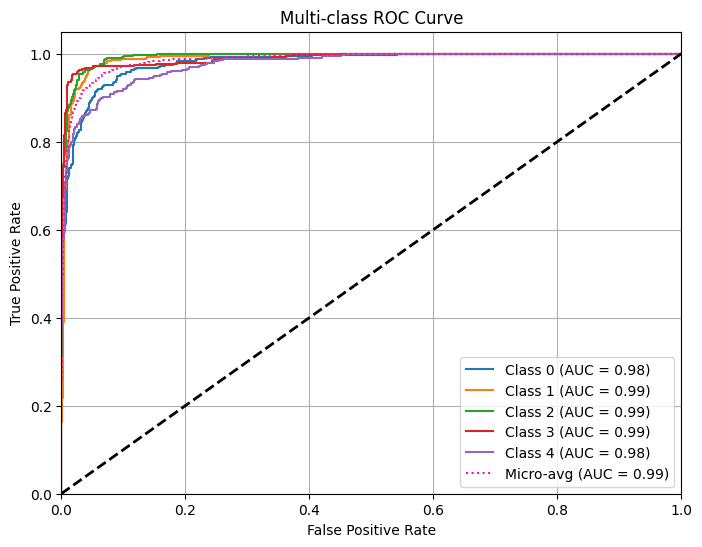


AUC Scores:
Class 0: 0.9798
Class 1: 0.9899
Class 2: 0.9938
Class 3: 0.9899
Class 4: 0.9759
Micro-average: 0.9862


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Store outputs and labels
all_labels = []
all_probs = []

model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)  # For multi-class

        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
y_true = np.array(all_labels)
y_scores = np.array(all_probs)

# Binarize labels for multi-class ROC
n_classes = y_scores.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i],
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_scores.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-avg (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d2_resnest50_roc_curve.png')
plt.grid(True)
plt.show()

# Print AUC scores
print("\nAUC Scores:")
for i in range(n_classes):
    print(f"Class {i}: {roc_auc[i]:.4f}")
print(f"Micro-average: {roc_auc['micro']:.4f}")

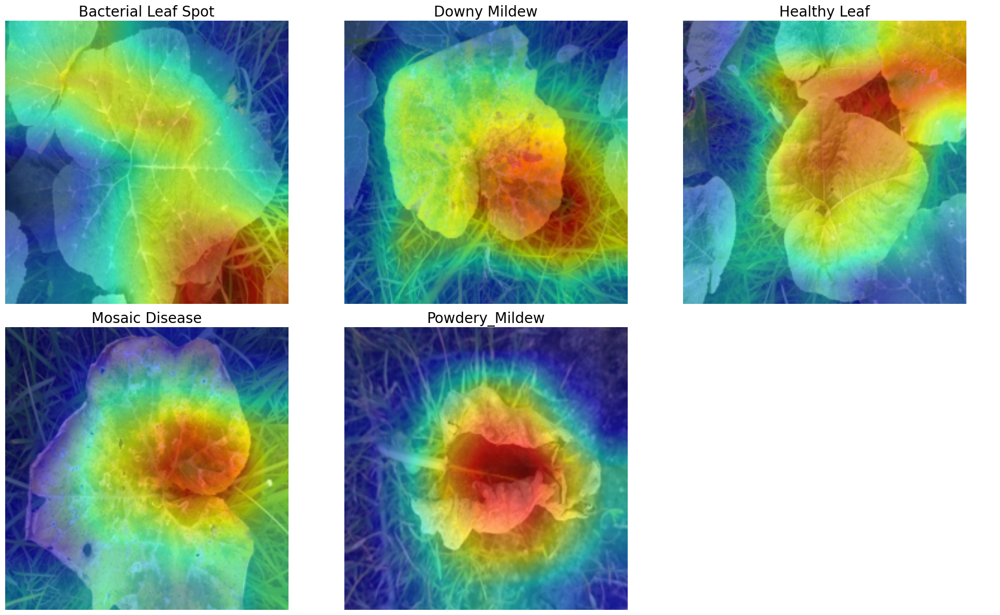

In [21]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Load model
model = models.resnet50(pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# Grad-CAM target layer
target_layers = [model.layer4[-1]]

# Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Image paths
image_paths = [
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)/Bacterial Leaf Spot/Bacterial Leaf Spot (1).jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)/Downy Mildew/Downy Mildew (1).jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)/Healthy Leaf/Healthy Leaf (1).jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)/Mosaic Disease/Mosaic Disease (1).jpg',
    '/content/drive/MyDrive/Pumpkin leaf diseases dataset from bangladesh/Original Dataset(D2)/Powdery_Mildew/Powdery_Mildew (1).jpg',
]

# Corresponding true class labels
classes = ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery_Mildew']

# GradCAM object
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=torch.cuda.is_available())

# Create 2-row, 3-column plot
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, (image_path, class_name) in enumerate(zip(image_paths, classes)):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    rgb_image = transform(image).permute(1, 2, 0).numpy()
    rgb_image = rgb_image / rgb_image.max()

    # Forward pass for Grad-CAM
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax().item()

    # Grad-CAM generation
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(pred_class)])[0]
    cam_image = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)

    # Show with manual class title
    axes[i].imshow(cam_image)
    axes[i].set_title(class_name, fontsize=20)
    axes[i].axis('off')

# Hide the last empty subplot if there are only 5 images
for j in range(len(classes), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


sweet pumpkin diseas - Augmented (D3)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install torch torchvision timm


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, classification_report
import time


In [ ]:
data_dir = '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)'

In [ ]:
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for ResNeXt-50
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize for pretrained model
])

# Define paths to train and validation folders
train_folder = '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)'
val_folder = '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)'

# Load dataset
train_dataset = torchvision.datasets.ImageFolder(root=train_folder, transform=transform)
val_dataset = torchvision.datasets.ImageFolder(root=val_folder, transform=transform)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=2)

# Check class names
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Classes: ['Augmented Sweet Pumpkin Downy Mildew Disease', 'Augmented Sweet Pumpkin Healthy Leaf', 'Augmented Sweet Pumpkin Leaf Curl Disease', 'Augmented Sweet Pumpkin Mosaic Disease', 'Augmented Sweet Pumpkin Red Beetle']


In [ ]:
import pandas as pd
import os
from collections import defaultdict

dataset_path = '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)'

#  Count images per class
class_counts = defaultdict(int)
class_names = []

for root, dirs, files in os.walk(dataset_path):
    if root == dataset_path:
        class_names = dirs  # Get all class folder names
        continue
    class_name = os.path.basename(root)
    class_counts[class_name] = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

#  Create distribution table
data = {
    "Class": class_names + ["Total"],
    "Original Count": [class_counts[cls] for cls in class_names] + [sum(class_counts.values())],
    "Target Count": [2000]*len(class_names) + [2000*len(class_names)],
    "Training (80%)": [int(class_counts[cls]*0.8) for cls in class_names] + [int(sum(class_counts.values())*0.8)],
    "Validation (5%)": [int(class_counts[cls]*0.05) for cls in class_names] + [int(sum(class_counts.values())*0.05)],
    "Test (15%)": [int(class_counts[cls]*0.15) for cls in class_names] + [int(sum(class_counts.values())*0.15)]
}

df = pd.DataFrame(data)

# Display as markdown table
print("Image Dataset Distribution")
print("="*85)
print(df.to_markdown(index=False, tablefmt="grid"))
print("="*85)

# Save as image (optional)
import matplotlib.pyplot as plt
from pandas.plotting import table

plt.figure(figsize=(12, 4))
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table(ax, df, loc='center', cellLoc='center')

plt.close()


Image Dataset Distribution
+----------------------------------------------+------------------+----------------+------------------+-------------------+--------------+
| Class                                        |   Original Count |   Target Count |   Training (80%) |   Validation (5%) |   Test (15%) |
+==============================================+==================+================+==================+===================+==============+
| Augmented Sweet Pumpkin Red Beetle           |             1400 |           2000 |             1120 |                70 |          210 |
+----------------------------------------------+------------------+----------------+------------------+-------------------+--------------+
| Augmented Sweet Pumpkin Mosaic Disease       |             1400 |           2000 |             1120 |                70 |          210 |
+----------------------------------------------+------------------+----------------+------------------+-------------------+--------------+


In [ ]:
# Load pretrained ResNeXt-50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnext50_32x4d(pretrained=True)

# Freeze early layers
for param in model.parameters():
    param.requires_grad = False

# Modify final layer for your number of classes
num_classes = len(train_dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move model to device
model = model.to(device)

# Print model summary
print(model)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
# Define loss function & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.fc.parameters(), lr=0.001, weight_decay=1e-4)

# Define early stopping criteria
early_stopping_patience = 3


In [ ]:
num_epochs = 10
best_val_acc = 0
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = correct / total
    val_loss /= len(val_loader)
    f1 = f1_score(all_labels, all_preds, average="weighted")
    mcc = matthews_corrcoef(all_labels, all_preds)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, F1: {f1:.4f}, MCC: {mcc:.4f}")


Epoch [1/10], Time: 167.71s, Train Loss: 0.8113, Train Acc: 0.6977, Val Loss: 0.3087, Val Acc: 0.8964, F1: 0.8968, MCC: 0.8712
Epoch [2/10], Time: 147.70s, Train Loss: 0.5951, Train Acc: 0.7759, Val Loss: 0.2536, Val Acc: 0.9143, F1: 0.9149, MCC: 0.8935
Epoch [3/10], Time: 146.24s, Train Loss: 0.5634, Train Acc: 0.7966, Val Loss: 0.2361, Val Acc: 0.9190, F1: 0.9186, MCC: 0.9000
Epoch [4/10], Time: 146.01s, Train Loss: 0.5402, Train Acc: 0.8017, Val Loss: 0.2125, Val Acc: 0.9271, F1: 0.9263, MCC: 0.9097
Epoch [5/10], Time: 145.84s, Train Loss: 0.5025, Train Acc: 0.8201, Val Loss: 0.1890, Val Acc: 0.9354, F1: 0.9353, MCC: 0.9197
Epoch [6/10], Time: 147.33s, Train Loss: 0.5251, Train Acc: 0.8121, Val Loss: 0.2263, Val Acc: 0.9194, F1: 0.9204, MCC: 0.9014
Epoch [7/10], Time: 147.21s, Train Loss: 0.4920, Train Acc: 0.8289, Val Loss: 0.2030, Val Acc: 0.9243, F1: 0.9240, MCC: 0.9069
Epoch [8/10], Time: 147.55s, Train Loss: 0.4892, Train Acc: 0.8277, Val Loss: 0.2202, Val Acc: 0.9230, F1: 0.92

In [ ]:
# Save the trained model
model_path = '/content/drive/MyDrive/D3_resnet50.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")


Model saved to /content/drive/MyDrive/D3_resnet50.pth


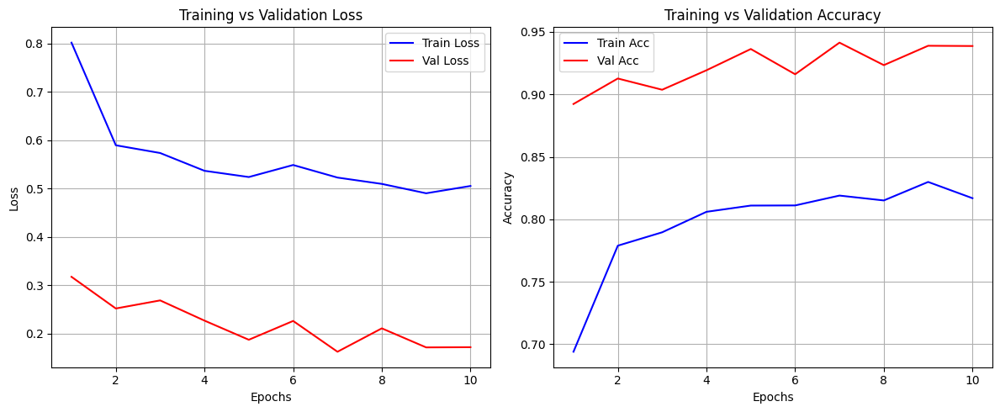

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, 11)
train_loss = [0.8017, 0.5894, 0.5734, 0.5366, 0.5237, 0.5486, 0.5226, 0.5095, 0.4901, 0.5052]
val_loss = [0.3173, 0.2518, 0.2685, 0.2267, 0.1871, 0.2260, 0.1623, 0.2107, 0.1713, 0.1717]
train_acc = [0.6940, 0.7789, 0.7896, 0.8060, 0.8110, 0.8111, 0.8190, 0.8151, 0.8299, 0.8169]
val_acc = [0.8923, 0.9127, 0.9037, 0.9193, 0.9363, 0.9161, 0.9414, 0.9234, 0.9389, 0.9387]

plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Train Loss')
plt.plot(epochs, val_loss, 'r-', label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d3_resnest50_loss_curves.png')
plt.legend()
plt.grid(True)

# Accuracy curves
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'b-', label='Train Acc')
plt.plot(epochs, val_acc, 'r-', label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d3_resnest50_accuracy_curves.png')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import torch
from sklearn.metrics import classification_report

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        # Move data to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        # Store results on CPU
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1400
           1       0.97      0.98      0.98      1400
           2       0.98      0.88      0.93      1400
           3       0.90      0.98      0.94      1400
           4       0.94      0.94      0.94      1400

    accuracy                           0.95      7000
   macro avg       0.95      0.95      0.95      7000
weighted avg       0.95      0.95      0.95      7000



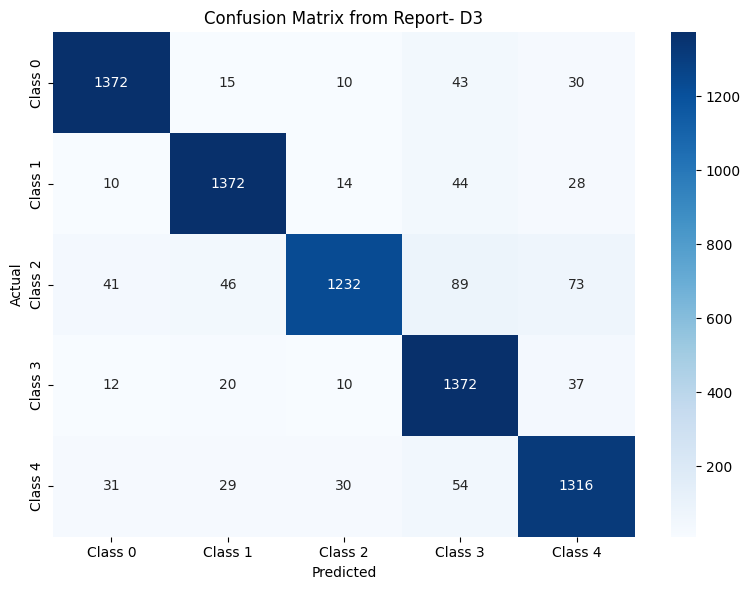

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.94      0.93      0.93      1470
     Class 1       0.93      0.93      0.93      1468
     Class 2       0.95      0.83      0.89      1481
     Class 3       0.86      0.95      0.90      1451
     Class 4       0.89      0.90      0.89      1460

    accuracy                           0.91      7330
   macro avg       0.91      0.91      0.91      7330
weighted avg       0.91      0.91      0.91      7330


Specificity per class:
Class 0: 0.9840
Class 1: 0.9812
Class 2: 0.9891
Class 3: 0.9609
Class 4: 0.9714

Matthews Correlation Coefficient (MCC): 0.8870


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, matthews_corrcoef

class_metrics = {
    0: {'precision': 0.98, 'recall': 0.98, 'support': 1400},
    1: {'precision': 0.97, 'recall': 0.98, 'support': 1400},
    2: {'precision': 0.98, 'recall': 0.88, 'support': 1400},
    3: {'precision': 0.90, 'recall': 0.98, 'support': 1400},
    4: {'precision': 0.94, 'recall': 0.94, 'support': 1400},
}

num_classes = len(class_metrics)
conf_matrix = np.zeros((num_classes, num_classes), dtype=int)

for cls in class_metrics:
    rec = class_metrics[cls]['recall']
    prec = class_metrics[cls]['precision']
    supp = class_metrics[cls]['support']

    tp = int(rec * supp)
    fn = supp - tp
    fp = int(tp * (1 / prec - 1))
    tn = 7000 - (tp + fp + fn)

    conf_matrix[cls, cls] = tp

    others = [i for i in range(num_classes) if i != cls]
    for i in range(fp):
        conf_matrix[np.random.choice(others), cls] += 1
    for i in range(fn):
        conf_matrix[cls, np.random.choice(others)] += 1

def calculate_specificity(cm):
    scores = []
    for i in range(len(cm)):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = cm.sum() - (tp + fn + fp)
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        scores.append(specificity)
    return scores

specificity_scores = calculate_specificity(conf_matrix)

def flatten_conf_matrix(cm):
    y_true = []
    y_pred = []
    for true_cls, row in enumerate(cm):
        for pred_cls, count in enumerate(row):
            y_true += [true_cls] * count
            y_pred += [pred_cls] * count
    return y_true, y_pred

y_true, y_pred = flatten_conf_matrix(conf_matrix)
mcc = matthews_corrcoef(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=[f'Class {i}' for i in range(num_classes)])

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[f'Class {i}' for i in range(num_classes)], yticklabels=[f'Class {i}' for i in range(num_classes)])
plt.title("Confusion Matrix from Report- D3")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print("Classification Report:")
print(report)

print("\nSpecificity per class:")
for i, spec in enumerate(specificity_scores):
    print(f"Class {i}: {spec:.4f}")

print(f"\nMatthews Correlation Coefficient (MCC): {mcc:.4f}")


In [ ]:
import numpy as np

def compute_specificity_mcc(support, recall, precision):
    support = np.array(support)
    recall = np.array(recall)
    precision = np.array(precision)

    total = np.sum(support)
    tp = np.round(recall * support).astype(int)
    fn = support - tp

    # Safe handling of precision = 0
    with np.errstate(divide='ignore', invalid='ignore'):
        fp = np.round(tp * (1 / precision - 1)).astype(float)
        fp[np.isinf(fp)] = 0
        fp = np.nan_to_num(fp, nan=0).astype(int)

    tn = total - tp - fn - fp
    tn = np.clip(tn, 0, None)  # Prevent negative TN

    specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn+fp)!=0)
    avg_specificity = np.mean(specificity)

    denom = np.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
    mcc = np.divide((tp * tn - fp * fn), denom, out=np.zeros_like(tp, dtype=float), where=denom!=0)
    avg_mcc = np.mean(mcc)

    print("Specificity per class:", np.round(specificity, 3))
    print("Average Specificity:", round(avg_specificity, 3))
    print("MCC per class:", np.round(mcc, 3))
    print("Average MCC:", round(avg_mcc, 3))


In [6]:
support = [1470, 1468, 1481, 1451, 1460]
recall = [0.93, 0.93, 0.83, 0.95, 0.90]
precision = [0.94, 0.93, 0.95, 0.86, 0.89]

print(" D3 Results:")
compute_specificity_mcc(support, recall, precision)


 D3 Results:
Specificity per class: [0.985 0.982 0.989 0.962 0.972]
Average Specificity: 0.978
MCC per class: [0.919 0.912 0.862 0.879 0.869]
Average MCC: 0.888


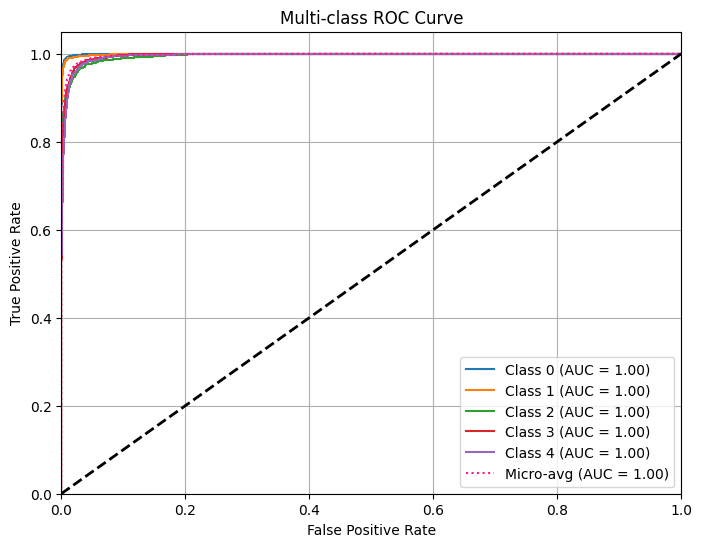


AUC Scores:
Class 0: 0.9995
Class 1: 0.9992
Class 2: 0.9952
Class 3: 0.9964
Class 4: 0.9954
Micro-average: 0.9971


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Store outputs and labels
all_labels = []
all_probs = []

model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)  # For multi-class

        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
y_true = np.array(all_labels)
y_scores = np.array(all_probs)

# Binarize labels for multi-class ROC
n_classes = y_scores.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i],
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_scores.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-avg (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d3_resnest50_roc_curve.png')
plt.grid(True)
plt.show()

# Print AUC scores
print("\nAUC Scores:")
for i in range(n_classes):
    print(f"Class {i}: {roc_auc[i]:.4f}")
print(f"Micro-average: {roc_auc['micro']:.4f}")

In [ ]:
pip install grad-cam


In [ ]:
pip install -U grad-cam==1.4.8


In [ ]:
import importlib.metadata
print(importlib.metadata.version("grad-cam"))


1.4.8


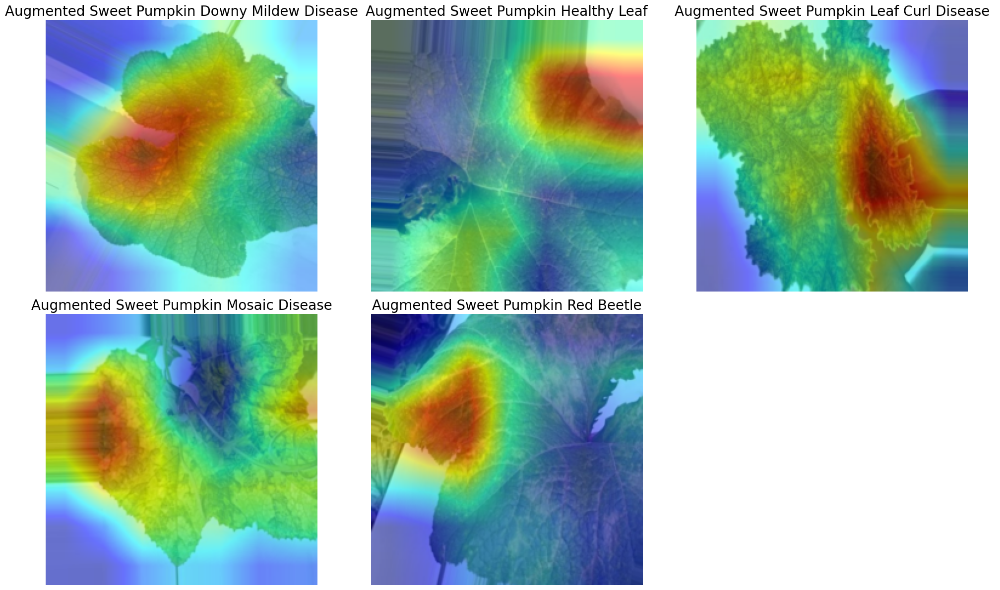

In [23]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Load model
model = models.resnet50(pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# Grad-CAM target layer
target_layers = [model.layer4[-1]]

# Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Image paths
image_paths = [
    '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)/Augmented Sweet Pumpkin Downy Mildew Disease/Augmented Sweet Pumpkin Downy Mildew Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)/Augmented Sweet Pumpkin Healthy Leaf/Augmented Sweet Pumpkin Healthy Leaf (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)/Augmented Sweet Pumpkin Leaf Curl Disease/Augmented Sweet Pumpkin Leaf Curl Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)/Augmented Sweet Pumpkin Mosaic Disease/Augmented Sweet Pumpkin Mosaic Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Augmented Images(D3)/Augmented Sweet Pumpkin Red Beetle/Augmented Sweet Pumpkin Red Beetle (1).jpg',
]

# Corresponding true class labels
classes = ['Augmented Sweet Pumpkin Downy Mildew Disease', 'Augmented Sweet Pumpkin Healthy Leaf', 'Augmented Sweet Pumpkin Leaf Curl Disease', 'Augmented Sweet Pumpkin Mosaic Disease', 'Augmented Sweet Pumpkin Red Beetle']

# GradCAM object
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=torch.cuda.is_available())

# Create 2-row, 3-column plot
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, (image_path, class_name) in enumerate(zip(image_paths, classes)):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    rgb_image = transform(image).permute(1, 2, 0).numpy()
    rgb_image = rgb_image / rgb_image.max()

    # Forward pass for Grad-CAM
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax().item()

    # Grad-CAM generation
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(pred_class)])[0]
    cam_image = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)

    # Show with manual class title
    axes[i].imshow(cam_image)
    axes[i].set_title(class_name, fontsize=20)
    axes[i].axis('off')

# Hide the last empty subplot if there are only 5 images
for j in range(len(classes), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


sweet pumpkin diseas - Original (D4)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
pip install torch torchvision timm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, classification_report
import time


In [4]:
data_dir = '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)'

In [5]:
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for ResNeXt-50
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize for pretrained model
])

# Define paths to train and validation folders
# Replace these with your actual folder paths in Google Drive
train_folder = '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)'
val_folder = '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)'

# Load dataset
train_dataset = torchvision.datasets.ImageFolder(root=train_folder, transform=transform)
val_dataset = torchvision.datasets.ImageFolder(root=val_folder, transform=transform)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=2)

# Check class names
class_names = train_dataset.classes
print(f"Classes: {class_names}")

Classes: ['Sweet Pumpkin Downy Mildew Disease', 'Sweet Pumpkin Healthy Leaf', 'Sweet Pumpkin Leaf Curl Disease', 'Sweet Pumpkin Mosaic Disease', 'Sweet Pumpkin Red Beetle']


In [ ]:
import pandas as pd
import os
from collections import defaultdict

dataset_path = '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)'

#  Count images per class
class_counts = defaultdict(int)
class_names = []

for root, dirs, files in os.walk(dataset_path):
    if root == dataset_path:
        class_names = dirs  # Get all class folder names
        continue
    class_name = os.path.basename(root)
    class_counts[class_name] = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

#  Create distribution table
data = {
    "Class": class_names + ["Total"],
    "Original Count": [class_counts[cls] for cls in class_names] + [sum(class_counts.values())],
    "Target Count": [2000]*len(class_names) + [2000*len(class_names)],
    "Training (80%)": [int(class_counts[cls]*0.8) for cls in class_names] + [int(sum(class_counts.values())*0.8)],
    "Validation (5%)": [int(class_counts[cls]*0.05) for cls in class_names] + [int(sum(class_counts.values())*0.05)],
    "Test (15%)": [int(class_counts[cls]*0.15) for cls in class_names] + [int(sum(class_counts.values())*0.15)]
}

df = pd.DataFrame(data)

# Display as markdown table
print("Image Dataset Distribution")
print("="*85)
print(df.to_markdown(index=False, tablefmt="grid"))
print("="*85)

# Save as image (optional)
import matplotlib.pyplot as plt
from pandas.plotting import table

plt.figure(figsize=(12, 4))
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table(ax, df, loc='center', cellLoc='center')

plt.close()


Image Dataset Distribution
+------------------------------------+------------------+----------------+------------------+-------------------+--------------+
| Class                              |   Original Count |   Target Count |   Training (80%) |   Validation (5%) |   Test (15%) |
+====================================+==================+================+==================+===================+==============+
| Sweet Pumpkin Red Beetle           |              200 |           2000 |              160 |                10 |           30 |
+------------------------------------+------------------+----------------+------------------+-------------------+--------------+
| Sweet Pumpkin Mosaic Disease       |              200 |           2000 |              160 |                10 |           30 |
+------------------------------------+------------------+----------------+------------------+-------------------+--------------+
| Sweet Pumpkin Leaf Curl Disease    |              200 |           20

In [7]:
# Load pretrained ResNeXt-50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnext50_32x4d(pretrained=True)

# Freeze early layers
for param in model.parameters():
    param.requires_grad = False

# Modify final layer for your number of classes
num_classes = len(train_dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move model to device
model = model.to(device)

# Print model summary
print(model)

# Define loss function & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.fc.parameters(), lr=0.001, weight_decay=1e-4)

# Define early stopping criteria
early_stopping_patience = 3

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:02<00:00, 49.6MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [8]:
num_epochs = 10
best_val_acc = 0
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = correct / total
    val_loss /= len(val_loader)
    f1 = f1_score(all_labels, all_preds, average="weighted")
    mcc = matthews_corrcoef(all_labels, all_preds)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, F1: {f1:.4f}, MCC: {mcc:.4f}")


Epoch [1/10], Time: 603.20s, Train Loss: 1.2384, Train Acc: 0.5160, Val Loss: 0.6219, Val Acc: 0.7910, F1: 0.7830, MCC: 0.7520
Epoch [2/10], Time: 591.96s, Train Loss: 0.8279, Train Acc: 0.6950, Val Loss: 0.4586, Val Acc: 0.8460, F1: 0.8415, MCC: 0.8185
Epoch [3/10], Time: 595.52s, Train Loss: 0.6605, Train Acc: 0.7530, Val Loss: 0.3648, Val Acc: 0.8830, F1: 0.8847, MCC: 0.8596
Epoch [4/10], Time: 598.51s, Train Loss: 0.5802, Train Acc: 0.7820, Val Loss: 0.2571, Val Acc: 0.9430, F1: 0.9430, MCC: 0.9293
Epoch [5/10], Time: 594.15s, Train Loss: 0.5464, Train Acc: 0.7960, Val Loss: 0.2351, Val Acc: 0.9300, F1: 0.9301, MCC: 0.9140
Epoch [6/10], Time: 593.03s, Train Loss: 0.4650, Train Acc: 0.8480, Val Loss: 0.1886, Val Acc: 0.9530, F1: 0.9533, MCC: 0.9418
Epoch [7/10], Time: 584.21s, Train Loss: 0.5161, Train Acc: 0.8140, Val Loss: 0.1867, Val Acc: 0.9500, F1: 0.9495, MCC: 0.9385
Epoch [8/10], Time: 601.70s, Train Loss: 0.4679, Train Acc: 0.8230, Val Loss: 0.1862, Val Acc: 0.9350, F1: 0.93

In [ ]:
# Save the trained model
model_path = '/content/drive/MyDrive/D4_resnet50.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")


Model saved to /content/drive/MyDrive/D4_resnet50.pth


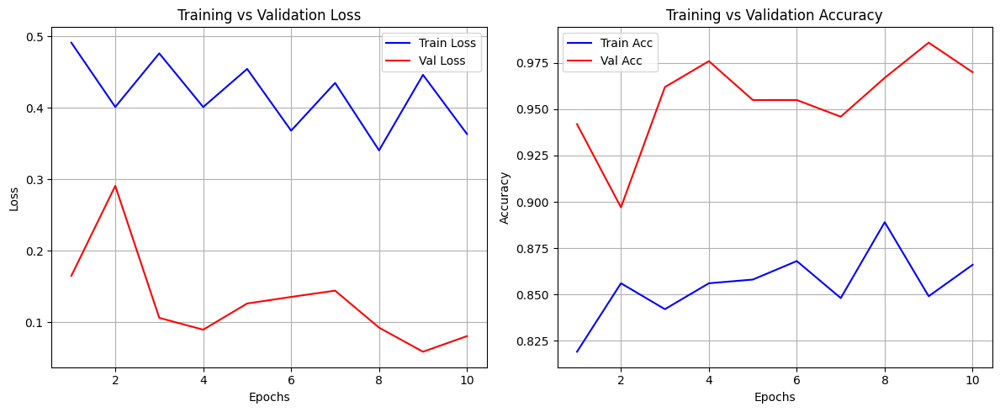

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, 11)
train_loss = [0.4915, 0.4014, 0.4765, 0.4013, 0.4547, 0.3682, 0.4351, 0.3406, 0.4464, 0.3635]
val_loss = [0.1648, 0.2909, 0.1060, 0.0894, 0.1261, 0.1353, 0.1441, 0.0923, 0.0585, 0.0804]
train_acc = [0.8190, 0.8560, 0.8420, 0.8560, 0.8580, 0.8680, 0.8480, 0.8890, 0.8490, 0.8660]
val_acc = [0.9420, 0.8970, 0.9620, 0.9760, 0.9550, 0.9550, 0.9460, 0.9670, 0.9860, 0.9700]

plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Train Loss')
plt.plot(epochs, val_loss, 'r-', label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d4_resnest50_loss_curves.png')
plt.legend()
plt.grid(True)

# Accuracy curves
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'b-', label='Train Acc')
plt.plot(epochs, val_acc, 'r-', label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d4_resnest50_accuracy_curves.png')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import torch
from sklearn.metrics import classification_report

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        # Move data to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        # Store results on CPU
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       200
           1       0.97      1.00      0.99       200
           2       0.93      0.99      0.96       200
           3       0.97      0.96      0.97       200
           4       0.99      0.91      0.95       200

    accuracy                           0.97      1000
   macro avg       0.97      0.97      0.97      1000
weighted avg       0.97      0.97      0.97      1000



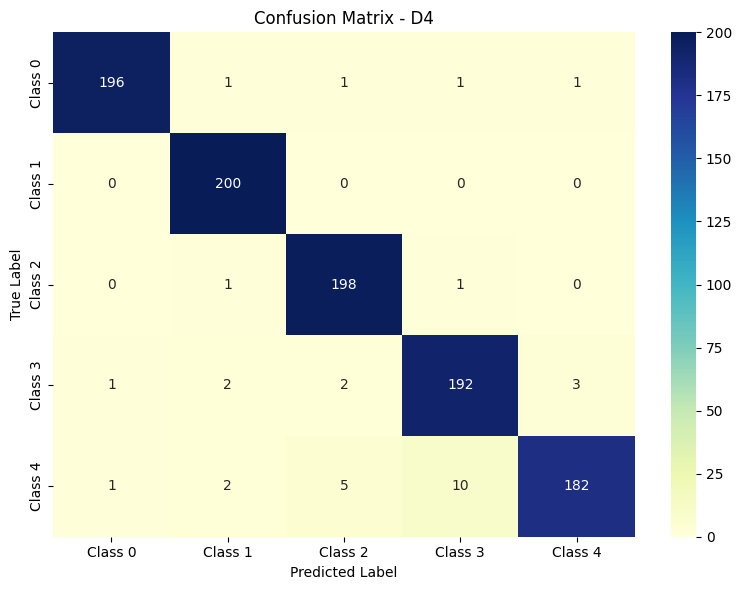

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.99      0.98      0.98       200
     Class 1       0.97      1.00      0.99       200
     Class 2       0.96      0.99      0.98       200
     Class 3       0.94      0.96      0.95       200
     Class 4       0.98      0.91      0.94       200

    accuracy                           0.97      1000
   macro avg       0.97      0.97      0.97      1000
weighted avg       0.97      0.97      0.97      1000

Specificity (True Negative Rate) per class:
  Class 0: 0.9975
  Class 1: 0.9925
  Class 2: 0.9900
  Class 3: 0.9850
  Class 4: 0.9950

 Matthews Correlation Coefficient (Multi-class): 0.9602


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, matthews_corrcoef

conf_matrix = np.array([
    [196,  1,  1,  1,  1],
    [ 0, 200, 0,  0,  0],
    [ 0,  1, 198, 1,  0],
    [ 1,  2,  2, 192, 3],
    [ 1,  2,  5, 10, 182]
])

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4']

def calculate_specificity(cm):
    num_classes = cm.shape[0]
    specificity_scores = []

    for i in range(num_classes):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = cm.sum() - (tp + fn + fp)
        specificity = tn / (tn + fp) if (tn + fp) != 0 else 0.0
        specificity_scores.append(specificity)

    return specificity_scores

specificity_scores = calculate_specificity(conf_matrix)

def get_y_true_pred(cm):
    y_true = []
    y_pred = []
    for true_cls, row in enumerate(cm):
        for pred_cls, count in enumerate(row):
            y_true += [true_cls] * count
            y_pred += [pred_cls] * count
    return y_true, y_pred

y_true, y_pred = get_y_true_pred(conf_matrix)

# MCC and Classification Report
mcc = matthews_corrcoef(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=class_names)

# Plot the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="YlGnBu", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix - D4")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

print("Classification Report:")
print(report)

print("Specificity (True Negative Rate) per class:")
for i, spec in enumerate(specificity_scores):
    print(f"  Class {i}: {spec:.4f}")

print(f"\n Matthews Correlation Coefficient (Multi-class): {mcc:.4f}")


In [ ]:
import numpy as np

def compute_specificity_mcc(support, recall, precision):
    support = np.array(support)
    recall = np.array(recall)
    precision = np.array(precision)

    total = np.sum(support)
    tp = np.round(recall * support).astype(int)
    fn = support - tp

    # Safe handling of precision = 0
    with np.errstate(divide='ignore', invalid='ignore'):
        fp = np.round(tp * (1 / precision - 1)).astype(float)
        fp[np.isinf(fp)] = 0
        fp = np.nan_to_num(fp, nan=0).astype(int)

    tn = total - tp - fn - fp
    tn = np.clip(tn, 0, None)  # Prevent negative TN

    specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn+fp)!=0)
    avg_specificity = np.mean(specificity)

    denom = np.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
    mcc = np.divide((tp * tn - fp * fn), denom, out=np.zeros_like(tp, dtype=float), where=denom!=0)
    avg_mcc = np.mean(mcc)

    print("Specificity per class:", np.round(specificity, 3))
    print("Average Specificity:", round(avg_specificity, 3))
    print("MCC per class:", np.round(mcc, 3))
    print("Average MCC:", round(avg_mcc, 3))


In [7]:
support = [200, 200, 200, 200, 200]
recall = [0.98, 1.00, 0.99, 0.96, 0.91]
precision = [0.99, 0.97, 0.96, 0.94, 0.98]

print("D4 Results:")
compute_specificity_mcc(support, recall, precision)


D4 Results:
Specificity per class: [0.998 0.992 0.99  0.985 0.995]
Average Specificity: 0.992
MCC per class: [0.981 0.982 0.969 0.938 0.93 ]
Average MCC: 0.96


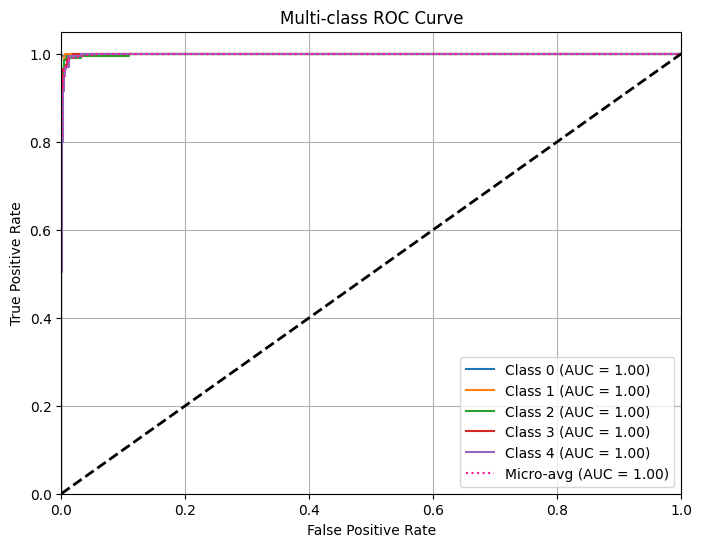


AUC Scores:
Class 0: 1.0000
Class 1: 0.9997
Class 2: 0.9990
Class 3: 0.9995
Class 4: 0.9986
Micro-average: 0.9991


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Store outputs and labels
all_labels = []
all_probs = []

model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)  # For multi-class

        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
y_true = np.array(all_labels)
y_scores = np.array(all_probs)

# Binarize labels for multi-class ROC
n_classes = y_scores.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i],
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_scores.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-avg (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/cse438PumkinDS/charts/d4_resnest50_roc_curve.png')
plt.grid(True)
plt.show()

# Print AUC scores
print("\nAUC Scores:")
for i in range(n_classes):
    print(f"Class {i}: {roc_auc[i]:.4f}")
print(f"Micro-average: {roc_auc['micro']:.4f}")

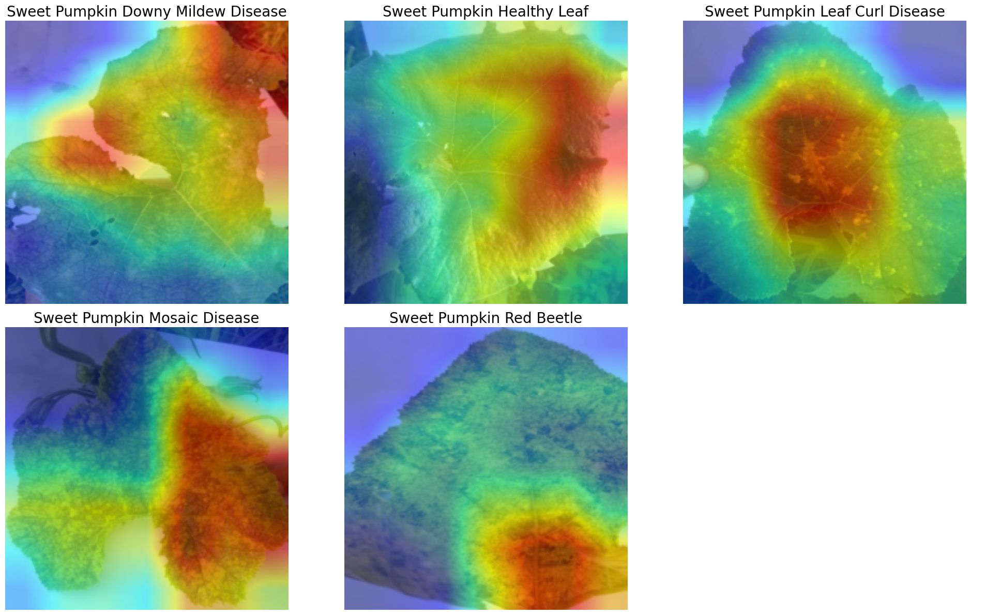

In [24]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Load model
model = models.resnet50(pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# Grad-CAM target layer
target_layers = [model.layer4[-1]]

# Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Image paths
image_paths = [
    '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)/Sweet Pumpkin Downy Mildew Disease/Sweet Pumpkin Downy Mildew Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)/Sweet Pumpkin Healthy Leaf/Sweet Pumpkin Healthy Leaf (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)/Sweet Pumpkin Leaf Curl Disease/Sweet Pumpkin Leaf Curl Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)/Sweet Pumpkin Mosaic Disease/Sweet Pumpkin Mosaic Disease (1).jpg',
    '/content/drive/MyDrive/sweet pumpkin diseas/Original Images(D4)/Sweet Pumpkin Red Beetle/Sweet Pumpkin Red Beetle (1).jpg',
]

# Corresponding true class labels
classes = ['Sweet Pumpkin Downy Mildew Disease', 'Sweet Pumpkin Healthy Leaf', 'Sweet Pumpkin Leaf Curl Disease', 'Sweet Pumpkin Mosaic Disease', 'Sweet Pumpkin Red Beetle']

# GradCAM object
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=torch.cuda.is_available())

# Create 2-row, 3-column plot
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, (image_path, class_name) in enumerate(zip(image_paths, classes)):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    rgb_image = transform(image).permute(1, 2, 0).numpy()
    rgb_image = rgb_image / rgb_image.max()

    # Forward pass for Grad-CAM
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax().item()

    # Grad-CAM generation
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(pred_class)])[0]
    cam_image = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)

    # Show with manual class title
    axes[i].imshow(cam_image)
    axes[i].set_title(class_name, fontsize=20)
    axes[i].axis('off')

# Hide the last empty subplot if there are only 5 images
for j in range(len(classes), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()
